# Model-VQ VAE 2
- VQVAE2
- PixelCNN

In [2]:
import gc
import numpy as np, pandas as pd, os
import xml.etree.ElementTree as ET 
import matplotlib.pyplot as plt, zipfile 
from PIL import Image 
from tqdm import tqdm_notebook
from torch.utils.data import TensorDataset, DataLoader
from collections import defaultdict
from sklearn.model_selection import train_test_split
import torchvision

In [35]:
import os
from torch.utils.data import Dataset
from PIL import Image
import json
class ImageNetKaggle(Dataset):
    def __init__(self, root, split, transform=None):
        self.samples = []
        self.targets = []
        self.transform = transform
        self.syn_to_class = {}
        with open(os.path.join(root, "imagenet_class_index.json"), "rb") as f:
                    json_file = json.load(f)
                    for class_id, v in json_file.items():
                        self.syn_to_class[v[0]] = int(class_id)
        with open(os.path.join(root, "ILSVRC2012_val_labels.json"), "rb") as f:
                    self.val_to_syn = json.load(f)
        samples_dir = os.path.join(root, "ILSVRC/Data/CLS-LOC", split)
        for entry in os.listdir(samples_dir):
            if split == "train":
                syn_id = entry
                target = self.syn_to_class[syn_id]
                syn_folder = os.path.join(samples_dir, syn_id)
                for sample in os.listdir(syn_folder):
                    sample_path = os.path.join(syn_folder, sample)
                    self.samples.append(sample_path)
                    self.targets.append(target)
            elif split == "val":
                syn_id = self.val_to_syn[entry]
                target = self.syn_to_class[syn_id]
                sample_path = os.path.join(samples_dir, entry)
                self.samples.append(sample_path)
                self.targets.append(target) 
            elif split == "test1":
                syn_id = entry
                target = self.syn_to_class[syn_id]
                syn_folder = os.path.join(samples_dir, syn_id)
                for sample in os.listdir(syn_folder):
                    sample_path = os.path.join(syn_folder, sample)
                    self.samples.append(sample_path)
                    self.targets.append(target)
    def __len__(self):
        return len(self.samples)    
    def __getitem__(self, idx):
        x = Image.open(self.samples[idx]).convert("RGB")
        if self.transform:
            x = self.transform(x)
        return x, self.targets[idx]

## General function

In [4]:
"""
Vector-Quantization for the VQ-VAE itself.
"""

import random

import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F


def vq_loss(inputs, embedded, commitment=0.25):
    """
    Compute the codebook and commitment losses for an
    input-output pair from a VQ layer.
    """
    return (torch.mean(torch.pow(inputs.detach() - embedded, 2)) +
            commitment * torch.mean(torch.pow(inputs - embedded.detach(), 2)))


class VQ(nn.Module):
    """
    A vector quantization layer.
    This layer takes continuous inputs and produces a few
    different types of outputs, including a discretized
    output, a commitment loss, a codebook loss, etc.
    Args:
        num_channels: the depth of the input Tensors.
        num_latents: the number of latent values in the
          dictionary to choose from.
        dead_rate: the number of forward passes after
          which a dictionary entry is considered dead if
          it has not been used.
    """

    def __init__(self, num_channels, num_latents, dead_rate=100):
        super().__init__()
        self.num_channels = num_channels
        self.num_latents = num_latents
        self.dead_rate = dead_rate

        self.dictionary = nn.Parameter(torch.randn(num_latents, num_channels))
        self.usage_count = nn.Parameter(dead_rate * torch.ones(num_latents).long(),
                                        requires_grad=False)
        self._last_batch = None

    def embed(self, idxs):
        """
        Convert encoded indices into embeddings.
        Args:
            idxs: an [N x H x W] or [N] Tensor.
        Returns:
            An [N x H x W x C] or [N x C] Tensor.
        """
        embedded = F.embedding(idxs, self.dictionary)
        if len(embedded.shape) == 4:
            # NHWC to NCHW
            embedded = embedded.permute(0, 3, 1, 2).contiguous()
        return embedded

    def forward(self, inputs):
        """
        Apply vector quantization.
        If the module is in training mode, this will also
        update the usage tracker and re-initialize dead
        dictionary entries.
        Args:
            inputs: the input Tensor. Either [N x C] or
              [N x C x H x W].
        Returns:
            A tuple (embedded, embedded_pt, idxs):
              embedded: the new [N x C x H x W] Tensor
                which passes gradients to the dictionary.
              embedded_pt: like embedded, but with a
                passthrough gradient estimator. Gradients
                through this pass directly to the inputs.
              idxs: a [N x H x W] Tensor of Longs
                indicating the chosen dictionary entries.
        """
        channels_last = inputs
        if len(inputs.shape) == 4:
            # NCHW to NHWC
            channels_last = inputs.permute(0, 2, 3, 1).contiguous()

        diffs = embedding_distances(self.dictionary, channels_last)
        idxs = torch.argmin(diffs, dim=-1)
        embedded = self.embed(idxs)
        embedded_pt = embedded.detach() + (inputs - inputs.detach())

        if self.training:
            self._update_tracker(idxs)
            self._last_batch = channels_last.detach()

        return embedded, embedded_pt, idxs

    def revive_dead_entries(self, inputs=None):
        """
        Use the dictionary usage tracker to re-initialize
        entries that aren't being used often.
        Args:
          inputs: a batch of inputs from which random
            values are sampled for new entries. If None,
            the previous input to forward() is used.
        """
        if inputs is None:
            assert self._last_batch is not None, ('cannot revive dead entries until a batch has ' +
                                                  'been run')
            inputs = self._last_batch
        counts = self.usage_count.detach().cpu().numpy()
        new_dictionary = None
        inputs_numpy = None
        for i, count in enumerate(counts):
            if count:
                continue
            if new_dictionary is None:
                new_dictionary = self.dictionary.detach().cpu().numpy()
            if inputs_numpy is None:
                inputs_numpy = inputs.detach().cpu().numpy().reshape([-1, inputs.shape[-1]])
            new_dictionary[i] = random.choice(inputs_numpy)
            counts[i] = self.dead_rate
        if new_dictionary is not None:
            dict_tensor = torch.from_numpy(new_dictionary).to(self.dictionary.device)
            counts_tensor = torch.from_numpy(counts).to(self.usage_count.device)
            self.dictionary.data.copy_(dict_tensor)
            self.usage_count.data.copy_(counts_tensor)

    def _update_tracker(self, idxs):
        raw_idxs = set(idxs.detach().cpu().numpy().flatten())
        update = -np.ones([self.num_latents], dtype=np.int)
        for idx in raw_idxs:
            update[idx] = self.dead_rate
        self.usage_count.data.add_(torch.from_numpy(update).to(self.usage_count.device).long())
        self.usage_count.data.clamp_(0, self.dead_rate)


def embedding_distances(dictionary, tensor):
    """
    Compute distances between every embedding in a
    dictionary and every vector in a Tensor.
    This will not generate a huge intermediate Tensor,
    unlike the naive implementation.
    Args:
        dictionary: a [D x C] Tensor.
        tensor: a [... x C] Tensor.
    Returns:
        A [... x D] Tensor of distances.
    """
    dict_norms = torch.sum(torch.pow(dictionary, 2), dim=-1)
    tensor_norms = torch.sum(torch.pow(tensor, 2), dim=-1)

    # Work-around for https://github.com/pytorch/pytorch/issues/18862.
    exp_tensor = tensor[..., None].view(-1, tensor.shape[-1], 1)
    exp_dict = dictionary[None].expand(exp_tensor.shape[0], *dictionary.shape)
    dots = torch.bmm(exp_dict, exp_tensor)[..., 0]
    dots = dots.view(*tensor.shape[:-1], dots.shape[-1])

    return -2 * dots + dict_norms + tensor_norms[..., None]

In [5]:
"""
An implementation of the hierarchical VQ-VAE.
See https://arxiv.org/abs/1906.00446.
"""

import torch
import torch.nn as nn
import torch.nn.functional as F

# from .vq import VQ, vq_loss


class Encoder(nn.Module):
    """
    An abstract VQ-VAE encoder, which takes input Tensors,
    shrinks them, and quantizes the result.
    Sub-classes should overload the encode() method.
    Args:
        num_channels: the number of channels in the latent
          codebook.
        num_latents: the number of entries in the latent
          codebook.
        kwargs: arguments to pass to the VQ layer.
    """

    def __init__(self, num_channels, num_latents, **kwargs):
        super().__init__()
        self.vq = VQ(num_channels, num_latents, **kwargs)

    def encode(self, x):
        """
        Encode a Tensor before the VQ layer.
        Args:
            x: the input Tensor.
        Returns:
            A Tensor with the correct number of output
              channels (according to self.vq).
        """
        raise NotImplementedError

    def forward(self, x):
        """
        Apply the encoder.
        See VQ.forward() for return values.
        """
        return self.vq(self.encode(x))


class QuarterEncoder(Encoder):
    """
    The encoder from the original VQ-VAE paper that cuts
    the dimensions down by a factor of 4 in both
    directions.
    """

    def __init__(self, in_channels, out_channels, num_latents, **kwargs):
        super().__init__(out_channels, num_latents, **kwargs)
        self.conv1 = nn.Conv2d(in_channels, out_channels, 4, stride=2)
        self.conv2 = nn.Conv2d(out_channels, out_channels, 4, stride=2)
        self.residual1 = _make_residual(out_channels)
        self.residual2 = _make_residual(out_channels)

    def encode(self, x):
        # Padding is uneven, so we make the right and
        # bottom more padded arbitrarily.
        x = F.pad(x, (1, 2, 1, 2))
        x = self.conv1(x)
        x = F.relu(x)
        x = F.pad(x, (1, 2, 1, 2))
        x = self.conv2(x)
        x = x + self.residual1(x)
        x = x + self.residual2(x)
        return x


class HalfEncoder(Encoder):
    """
    An encoder that cuts the input size in half in both
    dimensions.
    """

    def __init__(self, in_channels, out_channels, num_latents, **kwargs):
        super().__init__(out_channels, num_latents, **kwargs)
        self.conv = nn.Conv2d(in_channels, out_channels, 3, stride=2, padding=1)
        self.residual1 = _make_residual(out_channels)
        self.residual2 = _make_residual(out_channels)

    def encode(self, x):
        x = self.conv(x)
        x = x + self.residual1(x)
        x = x + self.residual2(x)
        return x


class Decoder(nn.Module):
    """
    An abstract VQ-VAE decoder, which takes a stack of
    (differently-sized) input Tensors and produces a
    predicted output Tensor.
    Sub-classes should overload the forward() method.
    """

    def forward(self, inputs):
        """
        Apply the decoder to a list of inputs.
        Args:
            inputs: a sequence of input Tensors. There may
              be more than one in the case of a hierarchy,
              in which case the top levels come first.
        Returns:
            A decoded Tensor.
        """
        raise NotImplementedError


class QuarterDecoder(Decoder):
    """
    The decoder from the original VQ-VAE paper that
    upsamples the dimensions by a factor of 4 in both
    directions.
    """

    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.residual1 = _make_residual(in_channels)
        self.residual2 = _make_residual(in_channels)
        self.conv1 = nn.ConvTranspose2d(in_channels, in_channels, 4, stride=2, padding=1)
        self.conv2 = nn.ConvTranspose2d(in_channels, out_channels, 4, stride=2, padding=1)

    def forward(self, inputs):
        assert len(inputs) == 1
        x = inputs[0]
        x = x + self.residual1(x)
        x = x + self.residual2(x)
        x = F.relu(x)
        x = self.conv1(x)
        x = F.relu(x)
        x = self.conv2(x)
        return x


class HalfDecoder(Decoder):
    """
    A decoder that upsamples by a factor of 2 in both
    dimensions.
    """

    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.residual1 = _make_residual(in_channels)
        self.residual2 = _make_residual(in_channels)
        self.conv = nn.ConvTranspose2d(in_channels, out_channels, 4, stride=2, padding=1)

    def forward(self, inputs):
        assert len(inputs) == 1
        x = inputs[0]
        x = x + self.residual1(x)
        x = x + self.residual2(x)
        x = F.relu(x)
        x = self.conv(x)
        return x


class HalfQuarterDecoder(Decoder):
    """
    A decoder that takes two inputs. The first one is
    upsampled by a factor of two, and then combined with
    the second input which is further upsampled by a
    factor of four.
    """

    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.residual1 = _make_residual(in_channels)
        self.residual2 = _make_residual(in_channels)
        self.conv1 = nn.ConvTranspose2d(in_channels, in_channels, 4, stride=2, padding=1)
        self.conv2 = nn.Conv2d(in_channels * 2, in_channels, 3, padding=1)
        self.residual3 = _make_residual(in_channels)
        self.residual4 = _make_residual(in_channels)
        self.conv3 = nn.ConvTranspose2d(in_channels, in_channels, 4, stride=2, padding=1)
        self.conv4 = nn.ConvTranspose2d(in_channels, out_channels, 4, stride=2, padding=1)

    def forward(self, inputs):
        assert len(inputs) == 2

        # Upsample the top input to match the shape of the
        # bottom input.
        x = inputs[0]
        x = x + self.residual1(x)
        x = x + self.residual2(x)
        x = F.relu(x)
        x = self.conv1(x)
        x = F.relu(x)

        # Mix together the bottom and top inputs.
        x = torch.cat([x, inputs[1]], dim=1)
        x = self.conv2(x)

        x = x + self.residual3(x)
        x = x + self.residual4(x)
        x = F.relu(x)
        x = self.conv3(x)
        x = F.relu(x)
        x = self.conv4(x)
        return x


class VQVAE(nn.Module):
    """
    A complete VQ-VAE hierarchy.
    There are N encoders, stored from the bottom level to
    the top level, and N decoders stored from top to
    bottom.
    """

    def __init__(self, encoders, decoders):
        super().__init__()
        assert len(encoders) == len(decoders)
        self.encoders = encoders
        self.decoders = decoders
        for i, enc in enumerate(encoders):
            self.add_module('encoder_%d' % i, enc)
        for i, dec in enumerate(decoders):
            self.add_module('decoder_%d' % i, dec)

    def forward(self, inputs, commitment=0.25):
        """
        Compute training losses for a batch of inputs.
        Args:
            inputs: the input Tensor. If this is a Tensor
              of integers, then cross-entropy loss will be
              used for the final decoder. Otherwise, MSE
              will be used.
            commitment: the commitment loss coefficient.
        Returns:
            A dict of Tensors, containing at least:
              loss: the total training loss.
              losses: the MSE/log-loss from each decoder.
              reconstructions: a reconstruction Tensor
                from each decoder.
              embedded: outputs from every encoder, passed
                through the vector-quantization table.
                Ordered from bottom to top level.
        """
        all_encoded = [inputs]
        all_vq_outs = []
        total_vq_loss = 0.0
        total_recon_loss = 0.0
        for encoder in self.encoders:
            encoded = encoder.encode(all_encoded[-1])
            embedded, embedded_pt, _ = encoder.vq(encoded)
            all_encoded.append(encoded)
            all_vq_outs.append(embedded_pt)
            total_vq_loss = total_vq_loss + vq_loss(encoded, embedded, commitment=commitment)
        losses = []
        reconstructions = []
        for i, decoder in enumerate(self.decoders):
            dec_inputs = all_vq_outs[::-1][:i + 1]
            target = all_encoded[::-1][i + 1]
            recon = decoder(dec_inputs)
            reconstructions.append(recon)
            if target.dtype.is_floating_point:
                recon_loss = torch.mean(torch.pow(recon - target.detach(), 2))
            else:
                recon_loss = F.cross_entropy(recon.view(-1, recon.shape[-1]), target.view(-1))
            total_recon_loss = total_recon_loss + recon_loss
            losses.append(recon_loss)
        return {
            'loss': total_vq_loss + total_recon_loss,
            'losses': losses,
            'reconstructions': reconstructions,
            'embedded': all_vq_outs,
        }

    def revive_dead_entries(self):
        """
        Revive dead entries from all of the VQ layers.
        Only call this once the encoders have all been
        through a forward pass in training mode.
        """
        for enc in self.encoders:
            enc.vq.revive_dead_entries()

    def full_reconstructions(self, inputs):
        """
        Compute reconstructions of the inputs using all
        the different layers of the hierarchy.
        The first reconstruction uses only information
        from the top-level codes, the second uses only
        information from the top-level and second-to-top
        level codes, etc.
        This is not forward(inputs)['reconstructions'],
        since said reconstructions are simply each level's
        reconstruction of the next level's features.
        Instead, full_reconstructions reconstructs the
        original inputs.
        """
        terms = self(inputs)
        layer_recons = []
        for encoder, recon in zip(self.encoders[:-1][::-1], terms['reconstructions'][:-1]):
            _, embedded_pt, _ = encoder.vq(recon)
            layer_recons.append(embedded_pt)
        hierarchy_size = len(self.decoders)
        results = []
        for i in range(hierarchy_size - 1):
            num_actual = i + 1
            dec_in = terms['embedded'][-num_actual:][::-1] + layer_recons[num_actual - 1:]
            results.append(self.decoders[-1](dec_in))
        results.append(terms['reconstructions'][-1])
        return results


def _make_residual(channels):
    return nn.Sequential(
        nn.ReLU(),
        nn.Conv2d(channels, channels, 3, padding=1),
        nn.ReLU(),
        nn.Conv2d(channels, channels, 1),
    )

In [6]:
import numpy as np
import torch

# from .vq import embedding_distances

def test_embedding_distances():
    dictionary = torch.randn(15, 7)
    tensor = torch.randn(3, 3, 7)
    with torch.no_grad():
        actual = embedding_distances(dictionary, tensor).numpy()
        print(actual.shape)
        expected = naive_embedding_distances(dictionary, tensor).numpy()
        print(expected.shape)
        assert np.allclose(actual, expected, atol=1e-4)


def naive_embedding_distances(dictionary, tensor):
    return torch.sum(torch.pow(tensor[..., None, :] - dictionary, 2), dim=-1)

In [7]:
test_embedding_distances()

(3, 3, 15)
(3, 3, 15)


In [8]:
"""
An implementation of multi-head attention, based off of
https://github.com/unixpickle/xformer
"""

import math

import numpy as np

import torch
import torch.nn as nn
import torch.nn.functional as F


class PixelAttention(nn.Module):
    """
    An attention layer that operates on images.
    Args:
        num_channels: the input image depth.
        num_heads: the number of attention heads.
    """

    def __init__(self, num_channels, num_heads=8):
        super().__init__()
        self.attention = MaskedAttention(num_channels, num_heads=num_heads)

    def forward(self, *images, conds=None):
        """
        Apply masked attention to a batch of images.
        Args:
            images: one or more [N x C x H x W] Tensors.
            conds: ignored. Here for compatibility with
              the PixelCNN aggregator.
        Returns:
            A new list of [N x C x H x W] Tensors.
        """
        results = []
        for image in images:
            batch, num_channels, height, width = image.shape
            result = image.permute(0, 2, 3, 1)
            result = result.view(batch, height * width, num_channels)
            result = self.attention(result)
            result = result.view(batch, height, width, num_channels)
            result = result.permute(0, 3, 1, 2)
            results.append(result + image)
        if len(results) == 1:
            return results[0]
        return tuple(results)


class MaskedAttention(nn.Module):
    """
    An attention layer that operates on sequences of the
    shape [N x T x C], where N is the batch size, T is the
    number of timesteps, and C is the number of channels.
    Args:
        num_channels: the number of channels in the input
          sequences.
        num_heads: the number of attention heads to use.
    """

    def __init__(self, num_channels, num_heads=8):
        super().__init__()

        assert not num_channels % num_heads, 'heads must evenly divide channels'
        self.num_channels = num_channels
        self.num_heads = num_heads

        self.kqv_projection = nn.Linear(num_channels, num_channels * 3)
        self.mix_heads = nn.Linear(num_channels, num_channels)

    def forward(self, sequence):
        """
        Apply masked multi-head attention.
        Args:
            sequence: an [N x T x C] Tensor.
        Returns:
            A new [N x T x C] Tensor.
        """
        projected = self.kqv_projection(sequence)
        kqv = torch.split(projected, self.num_channels, dim=-1)
        keys, queries, values = [self._split_heads(x) for x in kqv]
        logits = torch.bmm(queries, keys.permute(0, 2, 1))
        logits /= math.sqrt(self.num_channels / self.num_heads)
        logits += self._logit_mask(sequence.shape[1])
        weights = F.softmax(logits, dim=-1)
        weighted_sum = torch.bmm(weights, values)
        combined = self._combine_heads(weighted_sum)
        return self.mix_heads(combined)

    def _split_heads(self, batch):
        """
        Split up the channels in a batch into groups, one
        per head.
        Args:
            batch: an [N x T x C] Tensor.
        Returns:
            An [N*H x T x C/H] Tensor.
        """
        batch_size = batch.shape[0]
        num_steps = batch.shape[1]
        split_channels = self.num_channels // self.num_heads
        batch = batch.view(batch_size, num_steps, self.num_heads, split_channels)
        batch = batch.permute(0, 2, 1, 3).contiguous()
        batch = batch.view(batch_size * self.num_heads, num_steps, split_channels)
        return batch

    def _combine_heads(self, batch):
        """
        Perform the inverse of _split_heads().
        Args:
            batch: an [N*H x T x C/H] Tensor.
        Returns:
            An [N x T x C] Tensor.
        """
        batch_size = batch.shape[0] // self.num_heads
        num_steps = batch.shape[1]
        split_channels = self.num_channels // self.num_heads
        batch = batch.view(batch_size, self.num_heads, num_steps, split_channels)
        batch = batch.permute(0, 2, 1, 3).contiguous()
        batch = batch.view(batch_size, num_steps, self.num_channels)
        return batch

    def _logit_mask(self, num_steps):
        row_indices = np.arange(num_steps)[:, None]
        col_indices = np.arange(num_steps)[None]
        upper = (row_indices >= col_indices)
        mask = np.where(upper, 0, -np.inf).astype(np.float32)
        return torch.from_numpy(mask).to(next(self.parameters()).device)

In [9]:
"""
An implementation of the Gated PixelCNN from
https://arxiv.org/abs/1606.05328.
"""

import torch
import torch.nn as nn
import torch.nn.functional as F


class PixelCNN(nn.Module):
    """
    A PixelCNN is a stack of PixelConv layers.
    """

    def __init__(self, *layers):
        super().__init__()
        for i, layer in enumerate(layers):
            self.add_module('layer_%d' % i, layer)
        self.layers = layers

    def forward(self, images, conds=None):
        """
        Apply the stack of PixelConv layers.
        It is assumed that the first layer is a
        PixelConvA, and the rest are PixelConvB's.
        This way, the first layer takes one input and the
        rest take two.
        Returns:
            A tuple (vertical, horizontal), one for each
              of the two directional stacks.
        """
        outputs = self.layers[0](images, conds=conds)
        for layer in self.layers[1:]:
            outputs = layer(*outputs, conds=conds)
        return outputs


class PixelConv(nn.Module):
    """
    An abstract base class for PixelCNN layers.
    """

    def __init__(self, depth_in, depth_out, cond_depth=None, horizontal=2, vertical=2):
        super().__init__()
        self.depth_in = depth_in
        self.depth_out = depth_out
        self.horizontal = horizontal
        self.vertical = vertical

        self._init_directional_convs()
        self.vert_to_horiz = nn.Conv2d(depth_out * 2, depth_out * 2, 1)
        self.cond_layer = None
        if cond_depth is not None:
            self.cond_layer = nn.Linear(cond_depth, depth_out * 4)

    def _init_directional_convs(self):
        raise NotImplementedError

    def _run_stacks(self, vert_in, horiz_in, conds):
        vert_out = self._run_padded_vertical(vert_in)
        horiz_out = self._run_padded_horizontal(horiz_in)
        horiz_out = horiz_out + self.vert_to_horiz(vert_out)

        if conds is not None:
            cond_bias = self._compute_cond_bias(conds)
            vert_out = vert_out + cond_bias[:, :self.depth_out*2]
            horiz_out = horiz_out + cond_bias[:, self.depth_out*2:]

        vert_out = gated_activation(vert_out)
        horiz_out = gated_activation(horiz_out)
        return vert_out, horiz_out

    def _run_padded_vertical(self, vert_in):
        raise NotImplementedError

    def _run_padded_horizontal(self, horiz_in):
        raise NotImplementedError

    def _compute_cond_bias(self, conds):
        if len(conds.shape) == 2:
            outputs = self.cond_layer(conds)
            return outputs.view(-1, outputs.shape[1], 1, 1)
        assert len(conds.shape) == 4
        conds_perm = conds.permute(0, 2, 3, 1)
        outputs = self.cond_layer(conds_perm)
        return outputs.permute(0, 3, 1, 2)


class PixelConvA(PixelConv):
    """
    The first layer in a PixelCNN. This layer is unlike
    the other layers, in that it does not allow the stack
    to see the current pixel.
    Args:
        depth_in: the number of input filters.
        depth_out: the number of output filters.
        cond_depth: the number of conditioning channels.
          If None, this is an unconditional model.
        horizontal: the receptive field of the horizontal
          stack.
        vertical: the receptive field of the vertical
          stack.
    """

    def __init__(self, depth_in, depth_out, cond_depth=None, horizontal=2, vertical=2):
        super().__init__(depth_in, depth_out, cond_depth=cond_depth, horizontal=2, vertical=2)

    def forward(self, images, conds=None):
        """
        Apply the layer to some images, producing latents.
        Args:
            images: an NCHW batch of images.
            conds: an optional conditioning value. If set,
              either an NCHW Tensor or an NxM Tensor.
        Returns:
            A tuple (vertical, horizontal), one for each
              of the two directional stacks.
        """
        return self._run_stacks(images, images, conds)

    def _init_directional_convs(self):
        self.vertical_conv = nn.Conv2d(self.depth_in, self.depth_out * 2,
                                       (self.vertical, self.horizontal*2 + 1))
        self.horizontal_conv = nn.Conv2d(self.depth_in, self.depth_out * 2, (1, self.horizontal))

    def _run_padded_vertical(self, vert_in):
        vert_pad = (self.horizontal, self.horizontal, self.vertical, 0)
        return self.vertical_conv(F.pad(vert_in, vert_pad))[:, :, :-1, :]

    def _run_padded_horizontal(self, horiz_in):
        return self.horizontal_conv(F.pad(horiz_in, (self.horizontal, 0, 0, 0)))[:, :, :, :-1]


class PixelConvB(PixelConv):
    """
    Any layer except the first in a PixelCNN.
    Args:
        depth_in: the number of input filters.
        cond_depth: the number of conditioning channels.
          If None, this is an unconditional model.
        horizontal: the receptive field of the horizontal
          stack.
        vertical: the receptive field of the vertical
          stack.
    """

    def __init__(self, depth_in, cond_depth=None, norm=False, horizontal=2, vertical=2):
        super().__init__(depth_in, depth_in, cond_depth=cond_depth, horizontal=horizontal,
                         vertical=vertical)
        self.horiz_residual = nn.Conv2d(depth_in, depth_in, 1)
        self.vert_norm = lambda x: x
        self.horiz_norm = lambda x: x
        if norm:
            self.vert_norm = ChannelNorm(depth_in)
            self.horiz_norm = ChannelNorm(depth_in)

    def forward(self, vert_in, horiz_in, conds=None):
        """
        Apply the layer to the outputs of previous
        vertical and horizontal stacks.
        Args:
            vert_in: an NCHW Tensor.
            horiz_in: an NCHW Tensor.
            conds: an optional conditioning value. If set,
              either an NCHW Tensor or an NxM Tensor.
        Returns:
            A tuple (vertical, horizontal), one for each
              of the two directional stacks.
        """
        vert_out, horiz_out = self._run_stacks(vert_in, horiz_in, conds)
        horiz_out = horiz_in + self.horiz_norm(self.horiz_residual(horiz_out))
        return self.vert_norm(vert_out), horiz_out

    def _init_directional_convs(self):
        self.vertical_conv = nn.Conv2d(self.depth_in, self.depth_out * 2,
                                       (self.vertical + 1, self.horizontal*2 + 1))
        self.horizontal_conv = nn.Conv2d(self.depth_in, self.depth_out * 2,
                                         (1, self.horizontal + 1))

    def _run_padded_vertical(self, vert_in):
        vert_pad = (self.horizontal, self.horizontal, self.vertical, 0)
        return self.vertical_conv(F.pad(vert_in, vert_pad))

    def _run_padded_horizontal(self, horiz_in):
        return self.horizontal_conv(F.pad(horiz_in, (self.horizontal, 0, 0, 0)))


class ChannelNorm(nn.Module):
    """
    A layer which applies layer normalization to the
    channels at each spacial location separately.
    """

    def __init__(self, num_channels):
        super().__init__()
        self.norm = nn.LayerNorm((num_channels,))

    def forward(self, x):
        x = x.permute(0, 2, 3, 1).contiguous()
        x = self.norm(x)
        x = x.permute(0, 3, 1, 2).contiguous()
        return x


def gated_activation(outputs):
    depth = outputs.shape[1] // 2
    tanh = torch.tanh(outputs[:, :depth])
    sigmoid = torch.sigmoid(outputs[:, depth:])
    return tanh * sigmoid

In [10]:
from math import cos, pi, floor, sin

from torch.optim import lr_scheduler

class CosineLR(lr_scheduler._LRScheduler):
    def __init__(self, optimizer, lr_min, lr_max, step_size):
        self.lr_min = lr_min
        self.lr_max = lr_max
        self.step_size = step_size
        self.iteration = 0

        super().__init__(optimizer, -1)

    def get_lr(self):
        lr = self.lr_min + 0.5 * (self.lr_max - self.lr_min) * (
            1 + cos(self.iteration / self.step_size * pi)
        )
        self.iteration += 1

        if self.iteration == self.step_size:
            self.iteration = 0

        return [lr for base_lr in self.base_lrs]


class PowerLR(lr_scheduler._LRScheduler):
    def __init__(self, optimizer, lr_min, lr_max, warmup):
        self.lr_min = lr_min
        self.lr_max = lr_max
        self.warmup = warmup
        self.iteration = 0

        super().__init__(optimizer, -1)

    def get_lr(self):
        if self.iteration < self.warmup:
            lr = (
                self.lr_min + (self.lr_max - self.lr_min) / self.warmup * self.iteration
            )

        else:
            lr = self.lr_max * (self.iteration - self.warmup + 1) ** -0.5

        self.iteration += 1

        return [lr for base_lr in self.base_lrs]


class SineLR(lr_scheduler._LRScheduler):
    def __init__(self, optimizer, lr_min, lr_max, step_size):
        self.lr_min = lr_min
        self.lr_max = lr_max
        self.step_size = step_size
        self.iteration = 0

        super().__init__(optimizer, -1)

    def get_lr(self):
        lr = self.lr_min + (self.lr_max - self.lr_min) * sin(
            self.iteration / self.step_size * pi
        )
        self.iteration += 1

        if self.iteration == self.step_size:
            self.iteration = 0

        return [lr for base_lr in self.base_lrs]


class LinearLR(lr_scheduler._LRScheduler):
    def __init__(self, optimizer, lr_min, lr_max, warmup, step_size):
        self.lr_min = lr_min
        self.lr_max = lr_max
        self.step_size = step_size
        self.warmup = warmup
        self.iteration = 0

        super().__init__(optimizer, -1)

    def get_lr(self):
        if self.iteration < self.warmup:
            lr = self.lr_max

        else:
            lr = self.lr_max + (self.iteration - self.warmup) * (
                self.lr_min - self.lr_max
            ) / (self.step_size - self.warmup)
        self.iteration += 1

        if self.iteration == self.step_size:
            self.iteration = 0

        return [lr for base_lr in self.base_lrs]


class CLR(lr_scheduler._LRScheduler):
    def __init__(self, optimizer, lr_min, lr_max, step_size):
        self.epoch = 0
        self.lr_min = lr_min
        self.lr_max = lr_max
        self.current_lr = lr_min
        self.step_size = step_size

        super().__init__(optimizer, -1)

    def get_lr(self):
        cycle = floor(1 + self.epoch / (2 * self.step_size))
        x = abs(self.epoch / self.step_size - 2 * cycle + 1)
        lr = self.lr_min + (self.lr_max - self.lr_min) * max(0, 1 - x)
        self.current_lr = lr

        self.epoch += 1

        return [lr for base_lr in self.base_lrs]


class Warmup(lr_scheduler._LRScheduler):
    def __init__(self, optimizer, model_dim, factor=1, warmup=16000):
        self.optimizer = optimizer
        self.model_dim = model_dim
        self.factor = factor
        self.warmup = warmup
        self.iteration = 0

        super().__init__(optimizer, -1)

    def get_lr(self):
        self.iteration += 1
        lr = (
            self.factor
            * self.model_dim ** (-0.5)
            * min(self.iteration ** (-0.5), self.iteration * self.warmup ** (-1.5))
        )

        return [lr for base_lr in self.base_lrs]


# Copyright 2019 fastai

# Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at

#     http://www.apache.org/licenses/LICENSE-2.0

# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.


# Borrowed from https://github.com/fastai/fastai and changed to make it runs like PyTorch lr scheduler


class CycleAnnealScheduler:
    def __init__(
        self, optimizer, lr_max, lr_divider, cut_point, step_size, momentum=None
    ):
        self.lr_max = lr_max
        self.lr_divider = lr_divider
        self.cut_point = step_size // cut_point
        self.step_size = step_size
        self.iteration = 0
        self.cycle_step = int(step_size * (1 - cut_point / 100) / 2)
        self.momentum = momentum
        self.optimizer = optimizer

    def get_lr(self):
        if self.iteration > 2 * self.cycle_step:
            cut = (self.iteration - 2 * self.cycle_step) / (
                self.step_size - 2 * self.cycle_step
            )
            lr = self.lr_max * (1 + (cut * (1 - 100) / 100)) / self.lr_divider

        elif self.iteration > self.cycle_step:
            cut = 1 - (self.iteration - self.cycle_step) / self.cycle_step
            lr = self.lr_max * (1 + cut * (self.lr_divider - 1)) / self.lr_divider

        else:
            cut = self.iteration / self.cycle_step
            lr = self.lr_max * (1 + cut * (self.lr_divider - 1)) / self.lr_divider

        return lr

    def get_momentum(self):
        if self.iteration > 2 * self.cycle_step:
            momentum = self.momentum[0]

        elif self.iteration > self.cycle_step:
            cut = 1 - (self.iteration - self.cycle_step) / self.cycle_step
            momentum = self.momentum[0] + cut * (self.momentum[1] - self.momentum[0])

        else:
            cut = self.iteration / self.cycle_step
            momentum = self.momentum[0] + cut * (self.momentum[1] - self.momentum[0])

        return momentum

    def step(self):
        lr = self.get_lr()

        if self.momentum is not None:
            momentum = self.get_momentum()

        self.iteration += 1

        if self.iteration == self.step_size:
            self.iteration = 0

        for group in self.optimizer.param_groups:
            group['lr'] = lr

            if self.momentum is not None:
                group['betas'] = (momentum, group['betas'][1])

        return lr


def anneal_linear(start, end, proportion):
    return start + proportion * (end - start)


def anneal_cos(start, end, proportion):
    cos_val = cos(pi * proportion) + 1

    return end + (start - end) / 2 * cos_val


class Phase:
    def __init__(self, start, end, n_iter, anneal_fn):
        self.start, self.end = start, end
        self.n_iter = n_iter
        self.anneal_fn = anneal_fn
        self.n = 0

    def step(self):
        self.n += 1

        return self.anneal_fn(self.start, self.end, self.n / self.n_iter)

    def reset(self):
        self.n = 0

    @property
    def is_done(self):
        return self.n >= self.n_iter


class CycleScheduler:
    def __init__(
        self,
        optimizer,
        lr_max,
        n_iter,
        momentum=(0.95, 0.85),
        divider=25,
        warmup_proportion=0.3,
        phase=('linear', 'cos'),
    ):
        self.optimizer = optimizer

        phase1 = int(n_iter * warmup_proportion)
        phase2 = n_iter - phase1
        lr_min = lr_max / divider

        phase_map = {'linear': anneal_linear, 'cos': anneal_cos}

        self.lr_phase = [
            Phase(lr_min, lr_max, phase1, phase_map[phase[0]]),
            Phase(lr_max, lr_min / 1e4, phase2, phase_map[phase[1]]),
        ]

        self.momentum = momentum

        if momentum is not None:
            mom1, mom2 = momentum
            self.momentum_phase = [
                Phase(mom1, mom2, phase1, phase_map[phase[0]]),
                Phase(mom2, mom1, phase2, phase_map[phase[1]]),
            ]

        else:
            self.momentum_phase = []

        self.phase = 0

    def step(self):
        lr = self.lr_phase[self.phase].step()

        if self.momentum is not None:
            momentum = self.momentum_phase[self.phase].step()

        else:
            momentum = None

        for group in self.optimizer.param_groups:
            group['lr'] = lr

            if self.momentum is not None:
                if 'betas' in group:
                    group['betas'] = (momentum, group['betas'][1])

                else:
                    group['momentum'] = momentum

        if self.lr_phase[self.phase].is_done:
            self.phase += 1

        if self.phase >= len(self.lr_phase):
            for phase in self.lr_phase:
                phase.reset()

            for phase in self.momentum_phase:
                phase.reset()

            self.phase = 0

        return lr, momentum


class LRFinder(lr_scheduler._LRScheduler):
    def __init__(self, optimizer, lr_min, lr_max, step_size, linear=False):
        ratio = lr_max / lr_min
        self.linear = linear
        self.lr_min = lr_min
        self.lr_mult = (ratio / step_size) if linear else ratio ** (1 / step_size)
        self.iteration = 0
        self.lrs = []
        self.losses = []

        super().__init__(optimizer, -1)

    def get_lr(self):
        lr = (
            self.lr_mult * self.iteration
            if self.linear
            else self.lr_mult ** self.iteration
        )
        lr = self.lr_min + lr if self.linear else self.lr_min * lr

        self.iteration += 1
        self.lrs.append(lr)

        return [lr for base_lr in self.base_lrs]

    def record(self, loss):
        self.losses.append(loss)

    def save(self, filename):
        with open(filename, 'w') as f:
            for lr, loss in zip(self.lrs, self.losses):
                f.write('{},{}\n'.format(lr, loss))


In [11]:
from torchvision import transforms
def load_images(train=True, batch_size = 16):
    while True:
        for data, _ in create_data_loader(batch_size):
            yield data


def create_data_loader(batch_size):

    mean = (0.485, 0.456, 0.406)
    std = (0.229, 0.224, 0.225)
    dataset = ImageNetKaggle('imagenet-object-localization-challenge', "train", transforms.Compose(
            [
                transforms.Resize(256),
                transforms.CenterCrop(224),
                transforms.ToTensor(),
#                 transforms.Normalize(mean, std),
            ]
        ))
    dataloader = DataLoader(dataset,batch_size=64,num_workers=8,drop_last=False,pin_memory=True)
    return dataloader

In [12]:
"""
Models for hierarchical image generation.
"""

import torch
import torch.nn as nn
import torch.nn.functional as F

def make_vae():
#     encoders = [QuarterEncoder(3, 128, 512), HalfEncoder(128, 128, 512)]
#     decoders = [HalfDecoder(128, 128), HalfQuarterDecoder(128, 3)]
    encoders = [QuarterEncoder(3, 64, 128), HalfEncoder(64, 64, 128)]
    decoders = [HalfDecoder(64, 64), HalfQuarterDecoder(64, 3)]
    return VQVAE(encoders, decoders)


class TopPrior(nn.Module):
    def __init__(self, depth=64, num_heads=2):
        super().__init__()
        self.embed = nn.Embedding(128, depth)
        self.pixel_cnn = PixelCNN(
            PixelConvA(depth, depth),

            PixelConvB(depth, norm=True),
            PixelConvB(depth, norm=True),
            PixelConvB(depth, norm=True),
            PixelConvB(depth, norm=True),
            PixelAttention(depth, num_heads=num_heads),

            PixelConvB(depth, norm=True),
            PixelConvB(depth, norm=True),
            PixelConvB(depth, norm=True),
            PixelConvB(depth, norm=True),
            PixelConvB(depth, norm=True),
            PixelAttention(depth, num_heads=num_heads),

            PixelConvB(depth, norm=True),
            PixelConvB(depth, norm=True),
            PixelConvB(depth, norm=True),
            PixelConvB(depth, norm=True),
            PixelConvB(depth, norm=True),
            PixelAttention(depth, num_heads=num_heads),

            PixelConvB(depth, norm=True),
            PixelConvB(depth, norm=True),
            PixelConvB(depth, norm=True),
            PixelConvB(depth, norm=True),
            PixelConvB(depth, norm=True),
            PixelAttention(depth, num_heads=num_heads),
        )
        self.out_stack = nn.Sequential(
            nn.Conv2d(depth * 2, depth, 1),
            Residual1x1(depth),
            Residual1x1(depth),
            Residual1x1(depth),
            Residual1x1(depth),
            Residual1x1(depth),
            Residual1x1(depth),
            Residual1x1(depth),
            Residual1x1(depth),
            Residual1x1(depth),
            Residual1x1(depth),
            nn.Conv2d(depth, 256, 1),
        )

    def forward(self, x):
        x = self.embed(x)
        x = x.permute(0, 3, 1, 2).contiguous()
        out1, out2 = self.pixel_cnn(x)
        return self.out_stack(torch.cat([out1, out2], dim=1))


class BottomPrior(nn.Module):
    def __init__(self, depth=64, num_heads=2):
        super().__init__()
        self.embed_top = nn.Embedding(128, depth)
        self.embed_bottom = nn.Embedding(128, depth)
        self.cond_stack = nn.Sequential(
            Residual3x3(depth),
            Residual3x3(depth),
            Residual3x3(depth),
            Residual3x3(depth),
            Residual3x3(depth),
            Residual3x3(depth),
            Residual3x3(depth),
            Residual3x3(depth),
            Residual3x3(depth),
            nn.ConvTranspose2d(depth, depth, 4, stride=2, padding=1),
        )
        self.pixel_cnn = PixelCNN(
            PixelConvA(depth, depth, cond_depth=depth),

            PixelConvB(depth, cond_depth=depth, norm=True),
            PixelConvB(depth, cond_depth=depth, norm=True),
            PixelConvB(depth, cond_depth=depth, norm=True),
            PixelConvB(depth, cond_depth=depth, norm=True),

            PixelConvB(depth, cond_depth=depth, norm=True),
            PixelConvB(depth, cond_depth=depth, norm=True),
            PixelConvB(depth, cond_depth=depth, norm=True),
            PixelConvB(depth, cond_depth=depth, norm=True),
            PixelConvB(depth, cond_depth=depth, norm=True),

            PixelConvB(depth, cond_depth=depth, norm=True),
            PixelConvB(depth, cond_depth=depth, norm=True),
            PixelConvB(depth, cond_depth=depth, norm=True),
            PixelConvB(depth, cond_depth=depth, norm=True),
            PixelConvB(depth, cond_depth=depth, norm=True),

            PixelConvB(depth, cond_depth=depth, norm=True),
            PixelConvB(depth, cond_depth=depth, norm=True),
            PixelConvB(depth, cond_depth=depth, norm=True),
            PixelConvB(depth, cond_depth=depth, norm=True),
            PixelConvB(depth, cond_depth=depth, norm=True),
        )
        self.out_stack = nn.Sequential(
            nn.Conv2d(depth * 2, depth, 1),
            nn.Conv2d(depth, 128, 1),
        )

    def forward(self, bottom, top):
        conds = self.embed_top(top)
        conds = conds.permute(0, 3, 1, 2).contiguous()
        conds = self.cond_stack(conds)

        out = self.embed_bottom(bottom)
        out = out.permute(0, 3, 1, 2).contiguous()
        out1, out2 = self.pixel_cnn(out, conds=conds)
        return self.out_stack(torch.cat([out1, out2], dim=1))


class Residual1x1(nn.Module):
    def __init__(self, num_channels):
        super().__init__()
        self.conv1 = nn.Conv2d(num_channels, num_channels, 1)
        self.conv2 = nn.Conv2d(num_channels, num_channels, 1)
        self.norm = ChannelNorm(num_channels)

    def forward(self, x):
        inputs = x
        x = F.relu(x)
        x = self.conv1(x)
        x = F.relu(x)
        x = self.conv2(x)
        return inputs + self.norm(x)


class Residual3x3(nn.Module):
    def __init__(self, num_channels):
        super().__init__()
        self.conv1 = nn.Conv2d(num_channels, num_channels, 3, padding=1)
        self.conv2 = nn.Conv2d(num_channels, num_channels, 3, padding=1)
        self.norm = ChannelNorm(num_channels)

    def forward(self, x):
        inputs = x
        x = F.relu(x)
        x = self.conv1(x)
        x = F.relu(x)
        x = self.conv2(x)
        return inputs + self.norm(x)


In [13]:
# !rm vae.pt

In [14]:
"""
Train a hierarchical VQ-VAE on 256x256 images.
"""

import argparse
import itertools
import os

from PIL import Image
import numpy as np
import torch
import torch.optim as optim

VAE_PATH = 'vae.pt'

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

def main_vae():
    epochs = 5000
    batch_size = 16
    device = torch.device(DEVICE)
    model = make_vae()
    if os.path.exists(VAE_PATH):
        model.load_state_dict(torch.load(VAE_PATH, map_location=DEVICE))
    model.to(device)
    optimizer = optim.Adam(model.parameters())
    schedule = CycleScheduler(optimizer, 0.001, batch_size * epochs, momentum=(0.95, 0.85),)
    data = load_images(batch_size = batch_size)
    for i in itertools.count():
        images = next(data).to(device)
        terms = model(images)
        mse, mse_top = terms['losses'][-1].item(), terms['losses'][0].item()
        print('step %d: mse=%f mse_top=%f' %
              (i, mse, mse_top))
        optimizer.zero_grad()
        terms['loss'].backward()
        schedule.step()
        optimizer.step()
        model.revive_dead_entries()
        
        if i == epochs: 
            torch.save(model.state_dict(), VAE_PATH)
            save_reconstructions(model, images)
            break

def save_reconstructions(vae, images):
    vae.eval()
    with torch.no_grad():
        recons = [torch.clamp(x, 0, 1).permute(0, 2, 3, 1).detach().cpu().numpy()
                  for x in vae.full_reconstructions(images)]
    vae.train()
    top_recons, real_recons = recons
    images = images.permute(0, 2, 3, 1).detach().cpu().numpy()

    columns = np.concatenate([top_recons, real_recons, images], axis=-2)
    columns = np.concatenate(columns, axis=0)
    Image.fromarray((columns * 255).astype('uint8')).save('reconstructions.png')

main_vae()

Exception ignored in: <function _releaseLock at 0x7f88bd1731f0>
Traceback (most recent call last):
  File "/home/exx/.conda/envs/vqvae/lib/python3.8/logging/__init__.py", line 227, in _releaseLock
    def _releaseLock():
KeyboardInterrupt: 


RuntimeError: DataLoader worker (pid(s) 2224969) exited unexpectedly

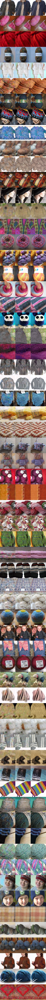

In [28]:
from PIL import Image
vae = Image.open('reconstructions.png')
vae

In [ ]:
# !rm top.pt

In [ ]:
"""
Train the top-level prior.
"""

import itertools
import os

import torch
import torch.nn as nn
import torch.optim as optim

TOP_PRIOR_PATH = 'top.pt'

def main_top():
    epochs = 60000
    batch_size = 64
    lr = 3e-4
    device = torch.device(DEVICE)

    vae = make_vae()
    vae.load_state_dict(torch.load(VAE_PATH, map_location='cpu'))
    vae.to(device)
    vae.eval()

    top_prior = TopPrior()
    if os.path.exists(TOP_PRIOR_PATH):
        top_prior.load_state_dict(torch.load(TOP_PRIOR_PATH, map_location='cuda'))
    top_prior.to(device)

    optimizer = optim.Adam(top_prior.parameters(), lr=lr)
    loss_fn = nn.CrossEntropyLoss()
    
    schedule = CycleScheduler(optimizer, lr, batch_size * epochs, momentum=(0.95, 0.85),)
    data = load_images(batch_size = batch_size)
    for i in itertools.count():
        images = next(data).to(device)
        _, _, encoded = vae.encoders[1](vae.encoders[0].encode(images))
        logits = top_prior(encoded)
        logits = logits.permute(0, 2, 3, 1).contiguous()
        logits = logits.view(-1, logits.shape[-1])
        loss = loss_fn(logits, encoded.view(-1))
        print('step %d: loss=%f' % (i, loss.item()))
        optimizer.zero_grad()
        loss.backward()
        schedule.step()
        optimizer.step()
        if not i % 30:
            torch.save(top_prior.state_dict(), TOP_PRIOR_PATH)
            
        if i == epochs: break

main_top()

In [ ]:
# !rm bottom.pt

In [ ]:
"""
Train the bottom-level prior.
"""

import itertools
import os

import torch
import torch.nn as nn
import torch.optim as optim

BOTTOM_PRIOR_PATH = 'bottom.pt'

def main_bottom():
    epochs = 60000
    batch_size = 64
    lr = 3e-4
    device = torch.device(DEVICE)

    vae = make_vae()
    vae.load_state_dict(torch.load(VAE_PATH, map_location='cuda'))
    vae.to(device)
    vae.eval()

    bottom_prior = BottomPrior()
    if os.path.exists(BOTTOM_PRIOR_PATH):
        bottom_prior.load_state_dict(torch.load(BOTTOM_PRIOR_PATH, map_location='cuda'))
    bottom_prior.to(device)

    optimizer = optim.Adam(bottom_prior.parameters(), lr=lr)
    loss_fn = nn.CrossEntropyLoss()

    schedule = CycleScheduler(optimizer, lr, batch_size * epochs, momentum=(0.95, 0.85),)
    data = load_images(batch_size = batch_size)
    for i in itertools.count():
        images = next(data).to(device)
        bottom_enc = vae.encoders[0].encode(images)
        _, _, bottom_idxs = vae.encoders[0].vq(bottom_enc)
        _, _, top_idxs = vae.encoders[1](bottom_enc)
        logits = bottom_prior(bottom_idxs, top_idxs)
        logits = logits.permute(0, 2, 3, 1).contiguous()
        logits = logits.view(-1, logits.shape[-1])
        loss = loss_fn(logits, bottom_idxs.view(-1))
        print('step %d: loss=%f' % (i, loss.item()))
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        if not i % 30:
            torch.save(bottom_prior.state_dict(), BOTTOM_PRIOR_PATH)
        if i == epochs: break

main_bottom()

In [ ]:
"""
Generate samples using the top-level prior.
"""

import argparse
import random

from PIL import Image
import numpy as np
import torch

NUM_SAMPLES = 4

def main_sample():
    device = torch.device(DEVICE)

    vae = make_vae()
    vae.load_state_dict(torch.load(VAE_PATH))
    vae.to(device)
    vae.eval()

    top_prior = TopPrior()
    top_prior.load_state_dict(torch.load(TOP_PRIOR_PATH))
    top_prior.to(device)

    results = np.zeros([NUM_SAMPLES, 8, 8], dtype=np.long)
    for row in range(results.shape[1]):
        for col in range(results.shape[2]):
            partial_in = torch.from_numpy(results[:, :row + 1]).to(device)
            with torch.no_grad():
                outputs = torch.softmax(top_prior(partial_in), dim=1).cpu().numpy()
            for i, out in enumerate(outputs):
                probs = out[:, row, col]
                results[i, row, col] = sample_softmax(probs)
        print('done row', row)
    with torch.no_grad():
        full_latents = torch.from_numpy(results).to(device)
        top_embedded = vae.encoders[1].vq.embed(full_latents)
        bottom_encoded = vae.decoders[0]([top_embedded])
        bottom_embedded, _, _ = vae.encoders[0].vq(bottom_encoded)
        decoded = torch.clamp(vae.decoders[1]([top_embedded, bottom_embedded]), 0, 1)
    decoded = decoded.permute(0, 2, 3, 1).cpu().numpy()
    decoded = np.concatenate(decoded, axis=1)
    Image.fromarray((decoded * 255).astype(np.uint8)).save('top_samples.png')


def sample_softmax(probs):
    number = random.random()
    for i, x in enumerate(probs):
        number -= x
        if number <= 0:
            return i
    return len(probs) - 1


def arg_parser():
    parser = argparse.ArgumentParser()
    parser.add_argument('--device', help='torch device', default='cuda')
    return parser

main_sample()

In [ ]:
samples = Image.open('top_samples.png')
samples